
<h1><center> <font color='black'> Psychometric network construction, embedding and community detection</font></center></h1>
<h2><center> <font color='black'> Network Science (LTAT.02.011)</font></center></h3>
<h2><center> <font color='black'> University of Tartu</font></center></h3>


================================================================================================================

**<h2><font color='red'>Student info:</font></h2>**


<font color='red'>Full name: </font> Tomáš Vojtíšek

<font color='red'>Student ID: </font> 39805140125



================================================================================================================

# 1. Link prediction using varoius scoring methods

In [1]:
!pip install python-igraph==0.8.3
!apt install libcairo2-dev pkg-config python3-dev
!pip install python-igraph leidenalg cairocffi
!pip install pycairo
!pip install networkx==2.8 #please install this version
!pip install scipy==1.8.0 #please install this version
!pip install matplotlib==3.5.1
!pip install pandas
!pip install numpy
!pip install tqdm
!pip install matplotlib


  Using cached python-igraph-0.8.3.tar.gz (4.1 MB)
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [1 lines of output]
      error in python-igraph setup command: use_2to3 is invalid.
      [end of output]
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
The operation couldn’t be completed. Unable to locate a Java Runtime.
Please visit http://www.java.com for information on installing Java.



In [4]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import networkx as nx
import matplotlib.pyplot as plt #For plotting graphs
import leidenalg
import igraph as ig
from networkx.algorithms import community

In [5]:
## Load self-report correlation matrix data
df_real = pd.read_csv("cormatrix.csv",index_col=0)
adj_matrix = df_real.values
np.fill_diagonal(adj_matrix, 0)
df_real.head()

,1,2,3,4,5,6,7,8,9,10,...,391,392,393,394,395,396,397,398,399,400
1,0.000000,-0.052595,0.148270,-0.023058,0.043706,0.019396,-0.067102,-0.097741,-0.073988,0.048886,...,-0.026331,-0.062503,-0.051813,0.011154,-0.012775,-0.024770,-0.061791,0.032879,0.054281,-0.042378
2,-0.052595,0.000000,-0.081053,0.000524,-0.022021,-0.028829,0.018525,-0.001278,0.008911,-0.005739,...,0.183835,-0.010461,-0.015937,0.009563,0.092852,0.036168,0.020052,-0.001535,-0.070076,-0.022967
3,0.148270,-0.081053,0.000000,-0.019327,0.088334,-0.039637,-0.035199,-0.020172,0.072069,0.153707,...,-0.102392,-0.016640,-0.005721,-0.041365,-0.003592,0.024901,0.028806,-0.003599,-0.031052,-0.021213
4,-0.023058,0.000524,-0.019327,0.000000,0.002587,0.029900,-0.007942,0.000978,-0.065102,-0.004786,...,-0.008299,-0.047100,-0.031203,-0.009791,0.019255,-0.019518,-0.019895,0.017270,0.022146,0.006169
5,0.043706,-0.022021,0.088334,0.002587,0.000000,-0.005488,-0.032541,0.009723,0.039916,0.029554,...,0.000848,0.012450,0.021845,-0.003072,0.008390,0.000362,0.015090,-0.034619,-0.005136,-0.002431


In [6]:
## Load fictional character correlation matrix data
df_fictional = pd.read_csv("cormatrixCharacters.csv",index_col=0)
df_fictional = df_fictional.iloc[:-1, :-1]
adj_matrix_fictional = df_fictional.values
np.fill_diagonal(adj_matrix_fictional, 0)
df_fictional.head()


,1,2,3,4,5,6,7,8,9,10,...,391,392,393,394,395,396,397,398,399,400
1,0.000000,-0.062026,0.726155,-0.175007,0.111152,0.272259,-0.313270,-0.821067,-0.231067,0.380659,...,-0.034620,-0.562034,-0.551704,-0.255315,-0.615891,0.285924,0.675081,0.162927,0.523363,-0.414817
2,-0.062026,0.000000,-0.018562,-0.133418,-0.520065,-0.250581,0.282060,-0.182092,0.161947,0.428640,...,0.860670,-0.086080,-0.141734,-0.150508,0.437774,0.606947,0.212162,-0.159120,-0.176834,-0.478676
3,0.726155,-0.018562,0.000000,-0.270884,0.189210,-0.117985,-0.102044,-0.558101,0.112259,0.598944,...,0.108594,-0.402412,-0.361306,0.075004,-0.348355,0.512799,0.717444,-0.222127,0.283531,-0.345186
4,-0.175007,-0.133418,-0.270884,0.000000,-0.061785,0.255906,-0.237866,0.134895,-0.477408,-0.218726,...,-0.255855,0.148131,-0.109099,-0.028669,0.108784,-0.274593,-0.326744,0.441962,-0.141887,0.438995
5,0.111152,-0.520065,0.189210,-0.061785,0.000000,-0.295600,-0.117825,-0.027284,0.174101,0.041151,...,-0.377350,0.238930,-0.052958,0.336036,-0.504028,-0.186221,0.046116,-0.261777,0.014672,0.327936


In [7]:
# Create a graph where edges of absolute weight less than 0.1 are removed.
graph_real_personality = nx.from_numpy_matrix(adj_matrix)
edges_to_remove_real = []
for u, v, weight in graph_real_personality.edges(data="weight",default=None):
  if weight is not None and abs(weight) < 0.1:
    edges_to_remove_real.append((u,v)) 
graph_real_personality.remove_edges_from(edges_to_remove_real)

In [8]:
# Create a graph where edges of absolute weight less than 0.1 are removed.
graph_fictional_personality = nx.from_numpy_matrix(adj_matrix_fictional)
edges_to_remove_fictional = []
for u, v, weight in graph_fictional_personality.edges(data="weight",default=None):
  if weight is not None and abs(weight) < 0.25:
    edges_to_remove_fictional.append((u,v)) 
graph_fictional_personality.remove_edges_from(edges_to_remove_fictional)

In [9]:
print(nx.is_negatively_weighted(graph_real_personality))
print(nx.is_negatively_weighted(graph_fictional_personality))

True
True


Descriptives

In [26]:
len(list(graph_real_personality.nodes))

400

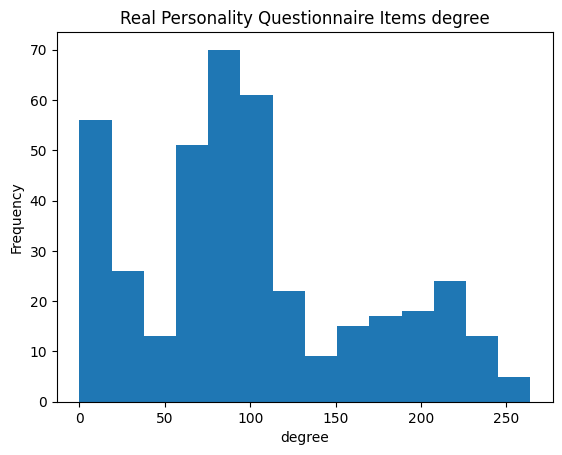

In [27]:
plt.hist([graph_real_personality.degree(n) for n in graph_real_personality.nodes()],bins="auto"),
plt.xlabel("degree")
plt.ylabel("Frequency")
plt.title("Real Personality Questionnaire items degree")
plt.show()

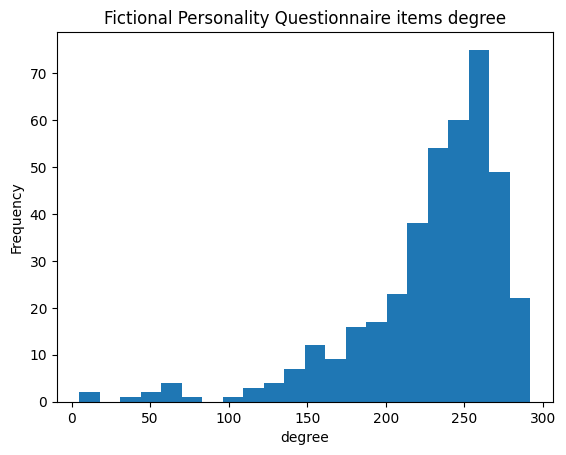

In [182]:
plt.hist([graph_fictional_personality.degree(n) for n in graph_fictional_personality.nodes()],bins="auto"),
plt.xlabel("degree")
plt.ylabel("Frequency")
plt.title("Fictional Personality Questionnaire items degree")
plt.show()

In [29]:
print(nx.classes.function.density(graph_real_personality))
print(nx.classes.function.density(graph_fictional_personality))

0.25141604010025065
0.5735588972431078


In [30]:
print(nx.transitivity(graph_real_personality))
print(nx.transitivity(graph_fictional_personality))

0.47653317080696567
0.654672623757457


In [31]:
print(sum(nx.triangles(graph_real_personality).values()))
print(sum(nx.triangles(graph_fictional_personality).values()))

1371411
7115532


In [32]:
print(nx.average_clustering(graph_real_personality)) # global clustering coefficient
print() # global clustering coefficient

0.5197235448311364
0.6566311970480679


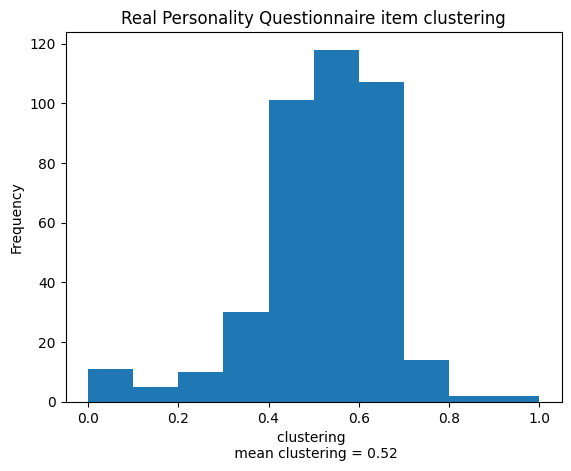

In [180]:
plt.hist(nx.clustering(graph_real_personality).values()) #local culstering coefficient for each node
plt.xlabel(str("").join(("clustering \n mean clustering = ",str(round(nx.average_clustering(graph_real_personality),2)))))
plt.ylabel("Frequency")
plt.title("Real Personality Questionnaire item clustering")
plt.show()

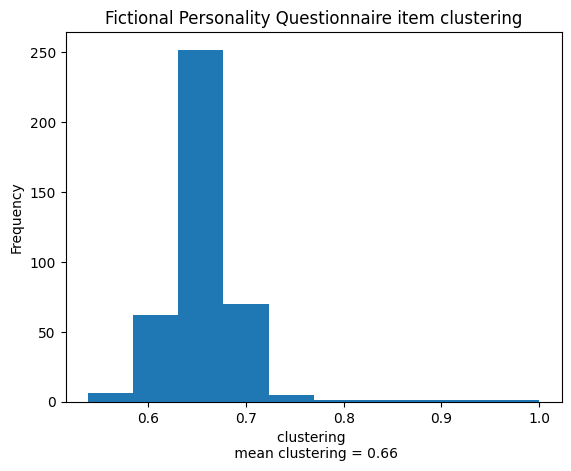

In [181]:
plt.hist(nx.clustering(graph_fictional_personality).values()) #local culstering coefficient for each node
plt.xlabel(str("").join(("clustering \n mean clustering = ",str(round(nx.average_clustering(graph_fictional_personality),2)))))
plt.ylabel("Frequency")
plt.title("Fictional Personality Questionnaire item clustering")
plt.show()

# Community detection 

In [17]:
print(nx.algorithms.components.number_connected_components(graph_real_personality))
print(nx.algorithms.components.number_connected_components(graph_fictional_personality))

2
1


So the real personality graph is not connected completely whereas the fictional personality graph is. 

We will continue work on the largest connected component of the real personality network

In [7]:

connected_components = nx.connected_components(graph_real_personality)

# Find the largest connected component
largest_component = max(connected_components, key=len)

# Create the subgraph containing the largest connected component
subgraph_real_personality = graph_real_personality.subgraph(largest_component)

## WalkTrap community detection 

In [8]:


# Check if the subgraph has nodes
if len(subgraph_real_personality) == 0:
    print("Subgraph does not contain any nodes.")
else:
    # Create an igraph graph object
    igraph_real_personality = ig.Graph(directed=False)

    # Get the node set from the subgraph
    subgraph_nodes = set(subgraph_real_personality.nodes())

    # Create a mapping dictionary for node ID remapping
    node_id_mapping = dict(zip(subgraph_nodes, range(len(subgraph_nodes))))

    # Add vertices (nodes) to the igraph graph
    for node_id in subgraph_nodes:
        vertex_index = node_id_mapping[node_id]
        igraph_real_personality.add_vertex(vertex_index)

    # Iterate over the edges in the subgraph and add them to the igraph graph
    added_edges = set()
    for u, v, data in subgraph_real_personality.edges(data=True):
        if (u, v) not in added_edges and (v, u) not in added_edges:
            # Remap the node IDs to vertex indices
            u_index = node_id_mapping[u]
            v_index = node_id_mapping[v]
            weight = data.get('weight', 1.0)  # Default weight if 'weight' attribute is missing
            igraph_real_personality.add_edge(u_index, v_index, weight=weight)
            added_edges.add((u, v))

    # Verify if the node with key '65' exists in the original graph_real_personality
    if '65' not in graph_real_personality.nodes():
        print("Node with key '65' does not exist in the original graph.")

igraph_real_personality.vs["name"] = range(1, 400)


Node with key '65' does not exist in the original graph.


In [9]:
# walktrap
igraph_fictional_personality  = ig.Graph(directed=False)
igraph_fictional_personality.add_vertices(graph_fictional_personality.nodes())
#igraph_graph.add_edges(graph_fictional_personality.edges())
added_edges_fictional = set()
for u, v, data in graph_fictional_personality.edges(data=True):
    if (u, v) not in added_edges_fictional and (v, u) not in added_edges_fictional:
        weight = data.get('weight', 1.0)  # Default weight if 'weight' attribute is missing
        igraph_fictional_personality.add_edge(u, v, weight=weight)
        added_edges_fictional.add((u, v))
igraph_fictional_personality.vs["name"] = range(1,401)

In [10]:
wtrap = igraph_real_personality.community_walktrap(steps=2)
clust = wtrap.as_clustering()
num_clusters = len(clust)
print(f"Number of Clusters: {num_clusters}")
ig.plot(clust,mark_groups=True,bbox=(600,600))

Number of Clusters: 43


In [11]:
wtrap = igraph_fictional_personality.community_walktrap(steps=2)
clust = wtrap.as_clustering()
num_clusters = len(clust)
print(f"Number of Clusters: {num_clusters}")
ig.plot(clust, mark_groups=True, bbox=(600, 600))


Number of Clusters: 4


## Greedy modularity community detection 

In [41]:
print(len(nx.community.greedy_modularity_communities(subgraph_real_personality)))


4


Number of communities in the Real personality data:
4


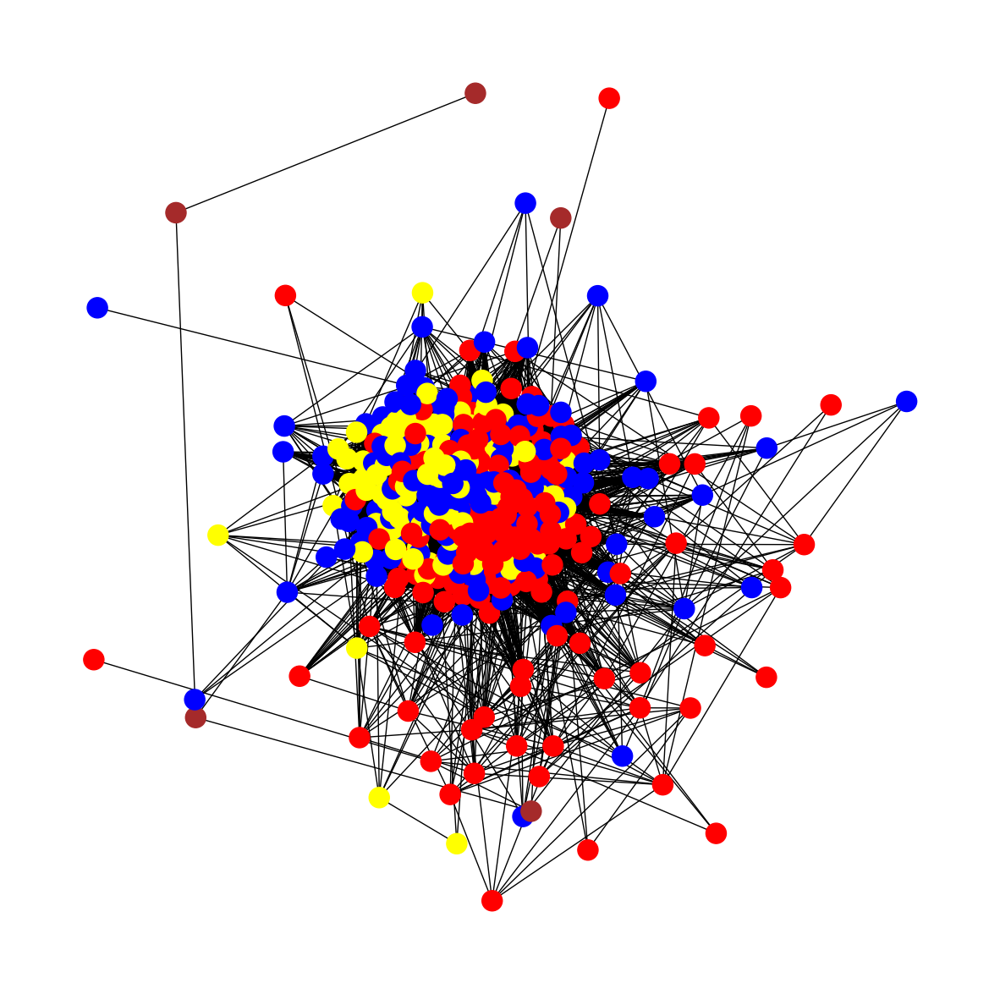

In [ ]:
#Community visualization
G = nx.Graph()

# Add nodes from the original graph
G.add_nodes_from(subgraph_real_personality.nodes())

# Add edges without weights from the original graph
G.add_edges_from(subgraph_real_personality.edges())
print("Number of communities in the Real personality data:")
print(len(nx.community.greedy_modularity_communities(G)))
colors = ["red", "blue", "yellow","brown","pink"]
pos = nx.spring_layout(G, k=0.5, iterations=50)
lst_b = community.greedy_modularity_communities(G)
color_map_b = {}
keys = G.nodes()
values = "black"
for i in keys:
        color_map_b[i] = values
counter = 0
for x in lst_b:
  for n in x:
    color_map_b[n] = colors[counter]
  counter = counter + 1
plt.figure(figsize=(15, 15))
community_real_list = list(lst_b)
nx.draw_networkx_edges(G, pos)
nx.draw_networkx_nodes(G, pos, node_color=dict(color_map_b).values())
#nx.draw_networkx_labels(G, pos,font_color="white")
plt.axis("off")
plt.show()

In [23]:
#Community visualization
G = nx.Graph()

# Add nodes from the original graph
G.add_nodes_from(graph_fictional_personality.nodes())

# Add edges without weights from the original graph
G.add_edges_from(graph_fictional_personality.edges())
print("Number of communities in the Fictional personality data:")
print(len(nx.community.greedy_modularity_communities(G)))
colors = ["red", "blue", "yellow","brown"]
pos = nx.spring_layout(G, k=0.5, iterations=50)
lst_b = community.greedy_modularity_communities(G)
color_map_b = {}
keys = G.nodes()
values = "black"
for i in keys:
        color_map_b[i] = values
counter = 0
for x in lst_b:
  for n in x:
    color_map_b[n] = colors[counter]
  counter = counter + 1
community_fict_list = list(lst_b)
plt.figure(figsize=(15, 15))
nx.draw_networkx_edges(G, pos)
nx.draw_networkx_nodes(G, pos, node_color=dict(color_map_b).values())
#nx.draw_networkx_labels(G, pos,font_color="white")
plt.axis("off")
plt.show()

Number of communities in the Fictional personality data:
2


AttributeError: 'frozenset' object has no attribute 'greedy_modularity_communities'

## Label Propagation !!  

Number of communities in the Fictional personality data:
1


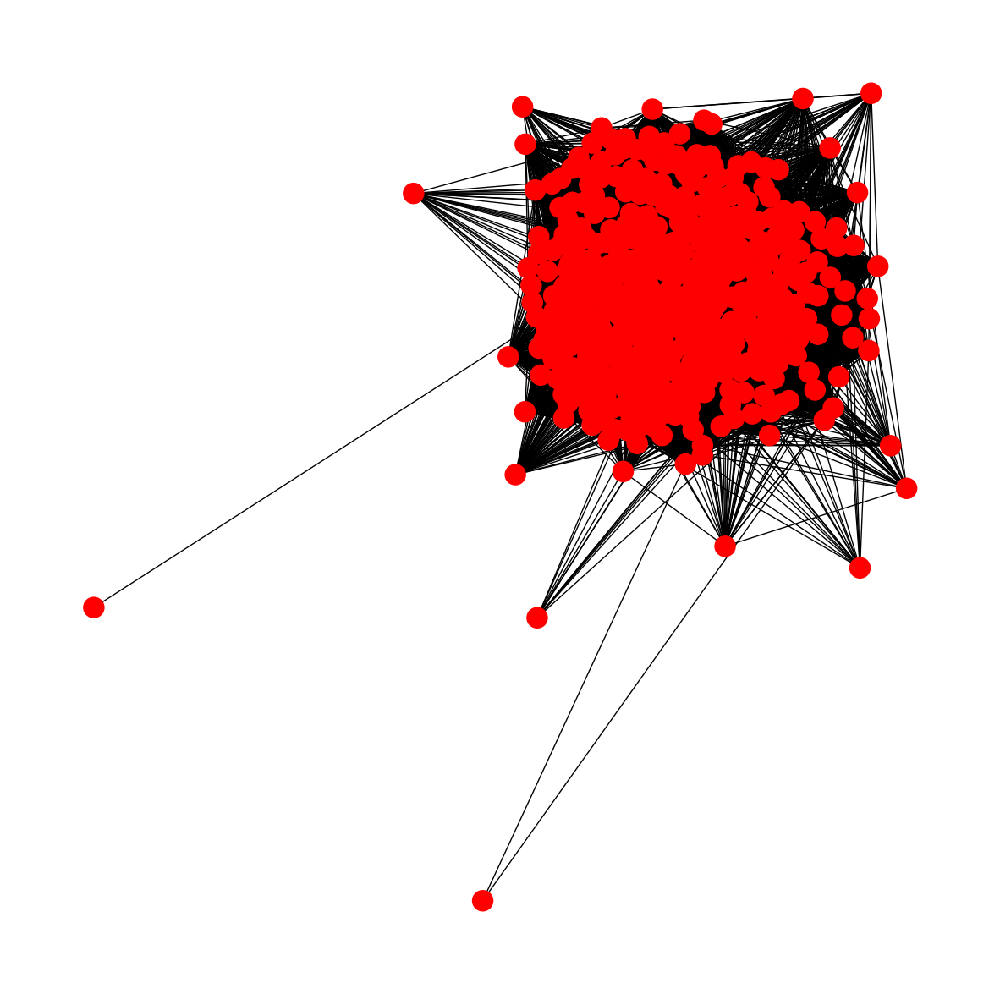

In [18]:
#Community visualization
G = nx.Graph()

# Add nodes from the original graph
G.add_nodes_from(graph_fictional_personality.nodes())

# Add edges without weights from the original graph
G.add_edges_from(graph_fictional_personality.edges())
print("Number of communities in the Fictional personality data:")
print(len(nx.community.label_propagation_communities(G)))
colors = ["red", "blue", "yellow","brown","pink"]
pos = nx.spring_layout(G, k=0.5, iterations=50)
lst_b = community.label_propagation_communities(G)
color_map_b = {}
keys = G.nodes()
values = "black"
for i in keys:
        color_map_b[i] = values
counter = 0
for x in lst_b:
  for n in x:
    color_map_b[n] = colors[counter]
  counter = counter + 1
plt.figure(figsize=(15, 15))
community_fict_list = list(lst_b)
nx.draw_networkx_edges(G, pos)
nx.draw_networkx_nodes(G, pos, node_color=dict(color_map_b).values())
#nx.draw_networkx_labels(G, pos,font_color="white")
plt.axis("off")
plt.show()

Number of communities in the Real personality data:
2


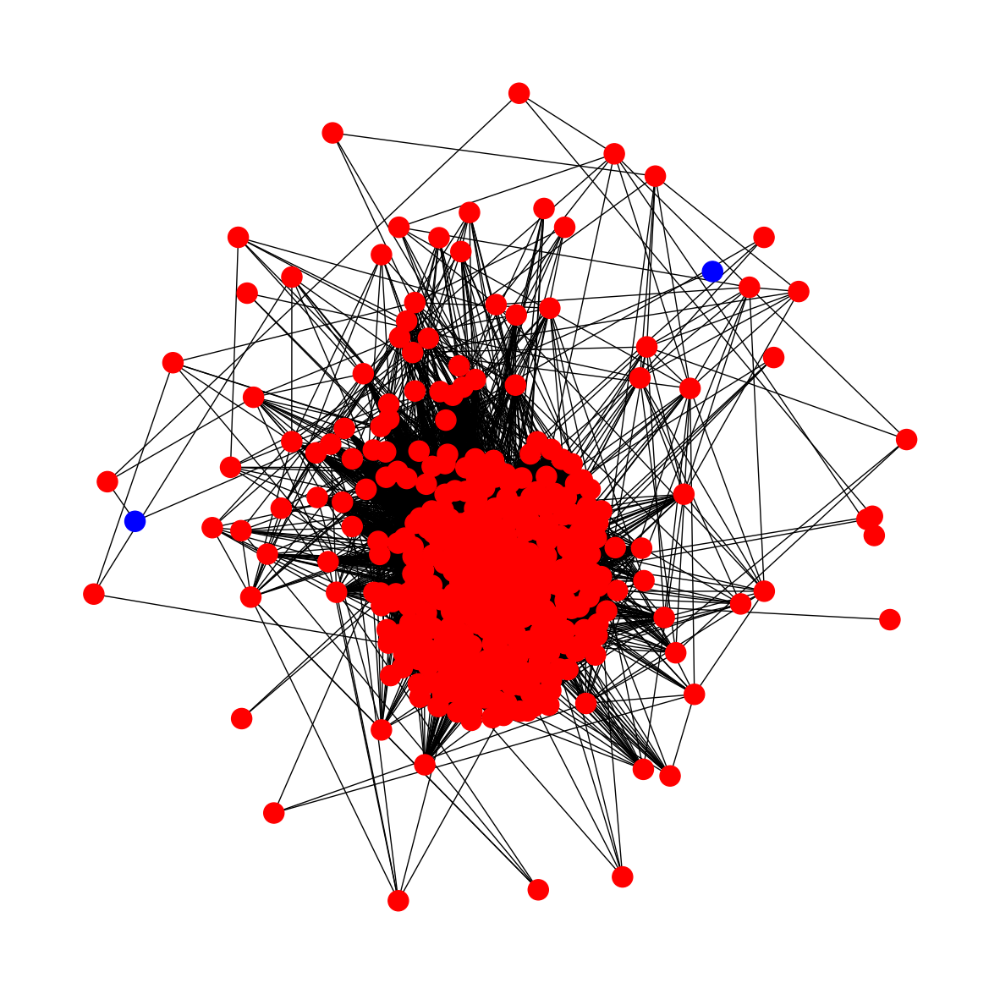

In [19]:
#Community visualization
G = nx.Graph()

# Add nodes from the original graph
G.add_nodes_from(subgraph_real_personality.nodes())

# Add edges without weights from the original graph
G.add_edges_from(subgraph_real_personality.edges())
print("Number of communities in the Real personality data:")
print(len(nx.community.label_propagation_communities(G)))
colors = ["red", "blue", "yellow","brown","pink"]
pos = nx.spring_layout(G, k=0.5, iterations=50)
lst_b = community.label_propagation_communities(G)
color_map_b = {}
keys = G.nodes()
values = "black"
for i in keys:
        color_map_b[i] = values
counter = 0
for x in lst_b:
  for n in x:
    color_map_b[n] = colors[counter]
  counter = counter + 1
plt.figure(figsize=(15, 15))
community_real_list = list(lst_b)
nx.draw_networkx_edges(G, pos)
nx.draw_networkx_nodes(G, pos, node_color=dict(color_map_b).values())
#nx.draw_networkx_labels(G, pos,font_color="white")
plt.axis("off")
plt.show()

In [21]:
import csv
def read_csv_to_dict(file_path):
    with open(file_path, 'r') as csvfile:
        reader = csv.DictReader(csvfile)
        return next(reader)

# Example usage
measures_dict = read_csv_to_dict('measures.csv')

In [22]:
for i, community in enumerate(community_fict_list):
    print(f"Community {i+1}:")
    for each in list(community):
        print(measures_dict[str(each + 1)])


Community 1:
['playful', 'serious']
['shy', 'bold']
['cheery', 'sorrowful']
['masculine', 'feminine']
['charming', 'awkward']
['lewd', 'tasteful']
['intellectual', 'physical']
['strict', 'lenient']
['refined', 'rugged']
['trusting', 'suspicious']
['innocent', 'worldly']
['artistic', 'scientific']
['stoic', 'expressive']
['cunning', 'honorable']
['orderly', 'chaotic']
['normal', 'weird']
['competitive', 'cooperative']
['tense', 'relaxed']
['brave', 'careful']
['spiritual', 'skeptical']
['unlucky', 'fortunate']
['ferocious', 'pacifist']
['modest', 'flamboyant']
['dominant', 'submissive']
['forgiving', 'vengeful']
['wise', 'foolish']
['impulsive', 'cautious']
['loyal', 'traitorous']
['creative', 'conventional']
['curious', 'apathetic']
['rude', 'respectful']
['diligent', 'lazy']
['lustful', 'chaste']
['chatty', 'reserved']
['emotional', 'logical']
['moody', 'stable']
['dunce', 'genius']
['arrogant', 'humble']
['heroic', 'villainous']
['attractive', 'repulsive']
['rational', 'whimsical']
[

In [24]:
for i, community in enumerate(community_real_list):
    print(f"Community {i+1}:")
    for each in list(community):
        print(measures_dict[str(each + 1)])

Community 1:
['playful', 'serious']
['shy', 'bold']
['cheery', 'sorrowful']
['charming', 'awkward']
['lewd', 'tasteful']
['intellectual', 'physical']
['strict', 'lenient']
['refined', 'rugged']
['trusting', 'suspicious']
['innocent', 'worldly']
['artistic', 'scientific']
['stoic', 'expressive']
['cunning', 'honorable']
['orderly', 'chaotic']
['normal', 'weird']
['competitive', 'cooperative']
['tense', 'relaxed']
['brave', 'careful']
['unlucky', 'fortunate']
['ferocious', 'pacifist']
['modest', 'flamboyant']
['dominant', 'submissive']
['forgiving', 'vengeful']
['wise', 'foolish']
['impulsive', 'cautious']
['loyal', 'traitorous']
['creative', 'conventional']
['curious', 'apathetic']
['rude', 'respectful']
['diligent', 'lazy']
['lustful', 'chaste']
['chatty', 'reserved']
['emotional', 'logical']
['moody', 'stable']
['dunce', 'genius']
['arrogant', 'humble']
['heroic', 'villainous']
['attractive', 'repulsive']
['rational', 'whimsical']
['mischievous', 'well behaved']
['aloof', 'obsessed']


## Embeddings and comparison

In [17]:
!pip install node2vec==0.4.1 
!pip install gensim==4.2.0 
!pip install gensim==3.2  # for some reason node2vec only loads if I download and install version 4.2 of gensim and then download and install version 3.2 of gensim...
!pip install node2vec
!pip install scikit-learn
!pip install networkx==2.8
!pip install scipy==1.8.0
from node2vec import Node2Vec

  Using cached gensim-3.2.0-cp310-cp310-macosx_13_0_arm64.whl
  Attempting uninstall: gensim
    Found existing installation: gensim 4.2.0
    Uninstalling gensim-4.2.0:
      Successfully uninstalled gensim-4.2.0


Slow version of gensim.models.doc2vec is being used
Slow version of Fasttext is being used


In [13]:
import networkx as nx
import pandas as pd
import numpy as np
import random
from tqdm import tqdm
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [18]:
pos_graph_fictional_personality = nx.Graph()
pos_graph_fictional_personality.add_nodes_from(graph_fictional_personality.nodes())

# Iterate over the edges of the original graph and add them to the new graph with absolute weights
for u, v, weight in graph_fictional_personality.edges(data='weight'):
    abs_weight = abs(weight)
    pos_graph_fictional_personality.add_edge(u, v, weight=abs_weight)
    

node2vec = Node2Vec(pos_graph_fictional_personality, dimensions=15, walk_length=5, num_walks=100, workers=1)
model = node2vec.fit(window=10,min_count=1)
# embedding_values = model.wv.vectors[:, 0] 
# plt.hist(embedding_values)

Computing transition probabilities:   0%|          | 0/400 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████| 100/100 [00:02<00:00, 35.55it/s]


In [21]:
pos_graph_real_personality = nx.Graph()
pos_graph_real_personality.add_nodes_from(graph_real_personality.nodes())

# Iterate over the edges of the original graph and add them to the new graph with absolute weights
for u, v, weight in graph_real_personality.edges(data='weight'):
    abs_weight = abs(weight)
    if (abs_weight == 0 or np.isnan(abs_weight)):
        continue
    pos_graph_real_personality.add_edge(u, v, weight=abs_weight)

node2vec = Node2Vec(pos_graph_real_personality, dimensions=15, walk_length=5, num_walks=100, workers=1)
model_real = node2vec.fit(window=10,min_count=1)
# embedding_values_real = model_real.wv.vectors[:, 0] 
# plt.hist(embedding_values_real)

Computing transition probabilities:   0%|          | 0/400 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████| 100/100 [00:02<00:00, 44.02it/s]


In [124]:
# in case this is run multiple times, first delete csv files
import os

# Specify the path to the CSV file you want to delete
file_path_list = ["similarity_values.csv","similarity_values_fictional.csv"]
for file_path in file_path_list:
    # Check if the file exists before deleting it
    if os.path.exists(file_path):
        os.remove(file_path)
        print("File deleted successfully.")
    else:
        print("File does not exist.")

File deleted successfully.
File deleted successfully.


In [125]:
import csv

node_list = list(graph_real_personality.nodes())

# Open the CSV file in write mode
with open('similarity_values.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)

    # Iterate over the nodes
    for i in node_list:
        for j in node_list:
            if i==j: continue
            similarity = model_real.wv.similarity(str(i), str(j))
            row = [str(i), str(j), similarity]

            # Write the row to the CSV file
            writer.writerow(row)

In [126]:
node_list = list(graph_fictional_personality.nodes())

# Open the CSV file in write mode
with open('similarity_values_fictional.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)

    # Iterate over the nodes
    for i in node_list:
        for j in node_list:
            if i==j: continue
            similarity = model.wv.similarity(str(i), str(j))
            row = [str(i), str(j), similarity]

            # Write the row to the CSV file
            writer.writerow(row)


Unfortunately, the gensim function of comparing similarity values does not work for me, but what it does is simply compute correlations, which is something we can do as easily manually, we have to compute the file 

In [127]:
similarities_real = pd.read_csv("similarity_values.csv",names=["from","to","similarity"])
similarities_fict = pd.read_csv("similarity_values_fictional.csv",names=["from","to","similarity"])

0         0.585390
1         0.894515
2         0.620173
3         0.171505
4         0.522307
            ...   
159595    0.605515
159596    0.597580
159597    0.284977
159598    0.529223
159599    0.671689
Name: similarity, Length: 159600, dtype: float64

Correlation coefficient: 0.021660170613613302
p-value: 4.964732446567269e-18


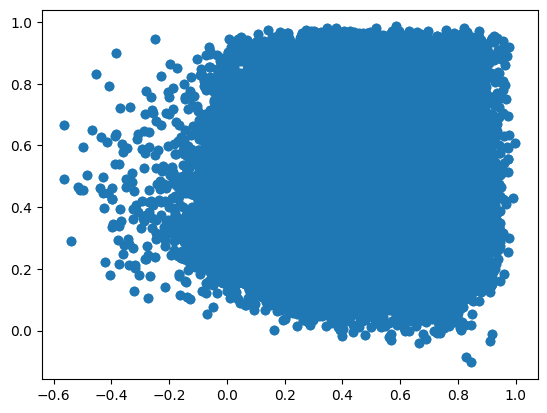

In [128]:
from scipy.stats import pearsonr

# Assuming embedding_values and embedding_values_real are your arrays/lists of values
correlation, p_value = pearsonr(similarities_real.similarity, similarities_fict.similarity)

print("Correlation coefficient:", correlation)
print("p-value:", p_value)
plt.scatter(similarities_real.similarity,similarities_fict.similarity)


In [19]:
## Load self-report subsample correlation matrix data
df_subsample_one = pd.read_csv("subset1CorMatrix.csv",index_col=0)
adj_matrix_subsample_one = df_subsample_one.values
np.fill_diagonal(adj_matrix_subsample_one, 0)
df_subsample_one.head()

,1,2,3,4,5,6,7,8,9,10,...,391,392,393,394,395,396,397,398,399,400
1,0.000000,-0.052067,0.148268,-0.023234,0.044078,0.018921,-0.067487,-0.098910,-0.073187,0.049893,...,-0.025904,-0.063337,-0.052497,0.008637,-0.014576,-0.028854,-0.062728,0.034435,0.053938,-0.041409
2,-0.052067,0.000000,-0.081348,-0.000044,-0.022814,-0.028970,0.018845,-0.000288,0.009386,-0.005423,...,0.185968,-0.009396,-0.013064,0.013936,0.094157,0.040884,0.021151,-0.000296,-0.070788,-0.024860
3,0.148268,-0.081348,0.000000,-0.018196,0.088583,-0.039627,-0.035209,-0.020658,0.072741,0.153038,...,-0.102278,-0.017433,-0.003780,-0.042664,-0.003960,0.024394,0.027579,-0.004260,-0.030969,-0.022330
4,-0.023234,-0.000044,-0.018196,0.000000,0.002495,0.029683,-0.007483,0.002761,-0.064615,-0.005055,...,-0.010017,-0.045575,-0.029661,-0.007721,0.018037,-0.020294,-0.021379,0.017955,0.021982,0.007289
5,0.044078,-0.022814,0.088583,0.002495,0.000000,-0.005521,-0.031354,0.008924,0.039967,0.030019,...,-0.000645,0.016646,0.023144,-0.001817,0.007360,-0.002849,0.017080,-0.035480,-0.005377,-0.001377


In [20]:
## Load self-report subsample correlation matrix data
df_subsample_two = pd.read_csv("subset2CorMatrix.csv",index_col=0)
adj_matrix_subsample_two = df_subsample_two.values
np.fill_diagonal(adj_matrix_subsample_two, 0)
df_subsample_two.head()

,1,2,3,4,5,6,7,8,9,10,...,391,392,393,394,395,396,397,398,399,400
1,0.000000,-0.053123,0.148272,-0.022884,0.043334,0.019870,-0.066716,-0.096571,-0.074789,0.047880,...,-0.026756,-0.061666,-0.051120,0.013682,-0.010986,-0.020684,-0.060848,0.031309,0.054625,-0.043347
2,-0.053123,0.000000,-0.080757,0.001092,-0.021229,-0.028687,0.018205,-0.002269,0.008436,-0.006055,...,0.181695,-0.011554,-0.018860,0.005181,0.091553,0.031464,0.018947,-0.002743,-0.069362,-0.021068
3,0.148272,-0.080757,0.000000,-0.020462,0.088083,-0.039647,-0.035189,-0.019686,0.071397,0.154378,...,-0.102506,-0.015858,-0.007691,-0.040065,-0.003224,0.025404,0.030033,-0.002930,-0.031134,-0.020092
4,-0.022884,0.001092,-0.020462,0.000000,0.002677,0.030118,-0.008402,-0.000809,-0.065589,-0.004516,...,-0.006582,-0.048633,-0.032759,-0.011867,0.020473,-0.018732,-0.018391,0.016566,0.022310,0.005046
5,0.043334,-0.021229,0.088083,0.002677,0.000000,-0.005455,-0.033728,0.010523,0.039866,0.029090,...,0.002346,0.008227,0.020522,-0.004340,0.009421,0.003570,0.013061,-0.033747,-0.004893,-0.003489


In [22]:
# Create a graph where edges of absolute weight less than 0.1 are removed.
graph_subsample_one = nx.from_numpy_matrix(adj_matrix_subsample_one)
edges_to_remove_graph_subsample_one = []
for u, v, weight in graph_subsample_one.edges(data="weight",default=None):
  if weight is not None and abs(weight) < 0.1:
    edges_to_remove_graph_subsample_one.append((u,v)) 
graph_subsample_one.remove_edges_from(edges_to_remove_graph_subsample_one)

In [23]:
# Create a graph where edges of absolute weight less than 0.1 are removed.
graph_subsample_two = nx.from_numpy_matrix(adj_matrix_subsample_two)
edges_to_remove_graph_subsample_two = []
for u, v, weight in graph_subsample_two.edges(data="weight",default=None):
  if weight is not None and abs(weight) < 0.1:
    edges_to_remove_graph_subsample_two.append((u,v)) 
graph_subsample_two.remove_edges_from(edges_to_remove_graph_subsample_two)

In [26]:
pos_graph_one = nx.Graph()
pos_graph_one.add_nodes_from(graph_subsample_one.nodes())

# Iterate over the edges of the original graph and add them to the new graph with absolute weights
for u, v, weight in graph_real_personality.edges(data='weight'):
    abs_weight = abs(weight)
    if (abs_weight == 0 or np.isnan(abs_weight)):
        continue
    pos_graph_one.add_edge(u, v, weight=abs_weight)

node2vecOne = Node2Vec(pos_graph_one, dimensions=15, walk_length=5, num_walks=100, workers=1)
model_one = node2vecOne.fit(window=10,min_count=1)
# embedding_values_real = model_real.wv.vectors[:, 0] 
# plt.hist(embedding_values_real)

Computing transition probabilities:   0%|          | 0/400 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████| 100/100 [00:02<00:00, 43.04it/s]


In [27]:
pos_graph_two = nx.Graph()
pos_graph_two.add_nodes_from(graph_subsample_two.nodes())

# Iterate over the edges of the original graph and add them to the new graph with absolute weights
for u, v, weight in graph_real_personality.edges(data='weight'):
    abs_weight = abs(weight)
    if (abs_weight == 0 or np.isnan(abs_weight)):
        continue
    pos_graph_two.add_edge(u, v, weight=abs_weight)

node2vecTwo = Node2Vec(pos_graph_two, dimensions=15, walk_length=5, num_walks=100, workers=1)
model_two = node2vecTwo.fit(window=10,min_count=1)
# embedding_values_real = model_real.wv.vectors[:, 0] 
# plt.hist(embedding_values_real)

Computing transition probabilities:   0%|          | 0/400 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████| 100/100 [00:02<00:00, 44.70it/s]


In [28]:
# in case this is run multiple times, first delete csv files
import os
import csv

# Specify the path to the CSV file you want to delete
file_path_list = ["similarity_subsample1.csv","similarity_subsample2.csv"]
for file_path in file_path_list:
    # Check if the file exists before deleting it
    if os.path.exists(file_path):
        os.remove(file_path)
        print("File deleted successfully.")
    else:
        print("File does not exist.")

node_list = list(pos_graph_one.nodes())

# Open the CSV file in write mode
with open('similarity_subsample1.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)

    # Iterate over the nodes
    for i in node_list:
        for j in node_list:
            if i==j: continue
            similarity = model_one.wv.similarity(str(i), str(j))
            row = [str(i), str(j), similarity]

            # Write the row to the CSV file
            writer.writerow(row)

node_list = list(pos_graph_two.nodes())

# Open the CSV file in write mode
with open('similarity_subsample2.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)

    # Iterate over the nodes
    for i in node_list:
        for j in node_list:
            if i==j: continue
            similarity = model_two.wv.similarity(str(i), str(j))
            row = [str(i), str(j), similarity]

            # Write the row to the CSV file
            writer.writerow(row)


File does not exist.
File does not exist.


In [29]:
similarities_one = pd.read_csv("similarity_subsample1.csv",names=["from","to","similarity"])
similarities_two = pd.read_csv("similarity_subsample2.csv",names=["from","to","similarity"])

Correlation coefficient: 0.8399020789758771
p-value: 0.0


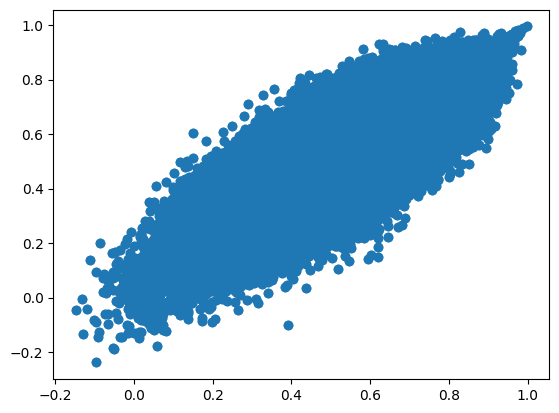

In [31]:
from scipy.stats import pearsonr

# Assuming embedding_values and embedding_values_real are your arrays/lists of values
correlation, p_value = pearsonr(similarities_one.similarity, similarities_two.similarity)

print("Correlation coefficient:", correlation)
print("p-value:", p_value)
plt.scatter(similarities_one.similarity,similarities_two.similarity)
